### Setup Environment:

In [17]:
from src.get_dataset import get_dataset, split_data
from src.data_loader import BRSETDataset, process_labels
from src.RetFound import get_retfound
from src.FocalLoss import FocalLoss
from src.model import FoundationalCVModel, FoundationalCVModelWithClassifier
from sklearn.utils.class_weight import compute_class_weight

import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader

from src.train import train
from src.test import test

In [18]:
# Constants:
DATASET = '/home/opc/Retina/BRSET/'
LABELS_PATH = os.path.join(DATASET, 'labels.csv')
IMAGES = os.path.join(DATASET, 'images/')
DOWNLOAD = False
SHAPE = (224, 224)
LABEL = 'DR_ICDR'
IMAGE_COL = 'image_id'
TEST_SIZE = 0.3
UNDERSAMPLE = False

"""
Dataset Mean and Std:
NORM_MEAN = [0.5896205017400412, 0.29888971649817453, 0.1107679405196557]
NORM_STD = [0.28544273712830986, 0.15905456049750208, 0.07012281660980953]

ImageNet Mean and Std:
NORM_MEAN = [0.485, 0.456, 0.406]
NORM_STD = [0.229, 0.224, 0.225]
"""

NORM_MEAN = None # [0.485, 0.456, 0.406]
NORM_STD = None # [0.229, 0.224, 0.225]

BACKBONE = 'convnextv2_large'
MODE = 'fine_tune'
backbone_mode= 'fine_tune' # 'fine_tune'

HIDDEN = [128]
num_classes = 3

BATCH_SIZE = 16
NUM_WORKERS = 4

LOSS = None #'focal_loss'
OPTIMIZER = 'adam'

# Define your hyperparameters
num_epochs = 50
learning_rate = 1e-5

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


#### Read csv file:

In [19]:
df = get_dataset(DATASET, download=DOWNLOAD, info=False)
df.head()

loading csv file in /home/opc/Retina/BRSET//labels.csv


,image_id,patient_id,camera,patient_age,comorbidities,diabetes_time_y,insuline,patient_sex,exam_eye,diabetes,...,vascular_occlusion,hypertensive_retinopathy,drusens,hemorrhage,retinal_detachment,myopic_fundus,increased_cup_disc,other,quality,normality
0,img00001,1,Canon CR,48.0,diabetes1,12,yes,1,1,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
1,img00002,1,Canon CR,48.0,diabetes1,12,yes,1,2,yes,...,0,0,0,0,0,0,1,0,Adequate,abnormal
2,img00003,2,Canon CR,18.0,diabetes1,7,yes,2,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
3,img00004,2,Canon CR,18.0,diabetes1,7,yes,2,2,yes,...,0,0,0,0,0,0,0,0,Adequate,normal
4,img00005,3,Canon CR,22.0,diabetes1,11,yes,1,1,yes,...,0,0,0,0,0,0,0,0,Adequate,normal


In [20]:
# Convert into 3 classes:

# Normal = 0; Non-proliferative = 1, 2, 3; Proliferative = 4
# Map values to categories
df[LABEL] = df[LABEL].apply(lambda x: 'Normal' if x == 0 else ('Non-proliferative' if x in [1, 2, 3] else 'Proliferative'))

Train data shape: (11386, 35)
Test data shape: (4880, 35)


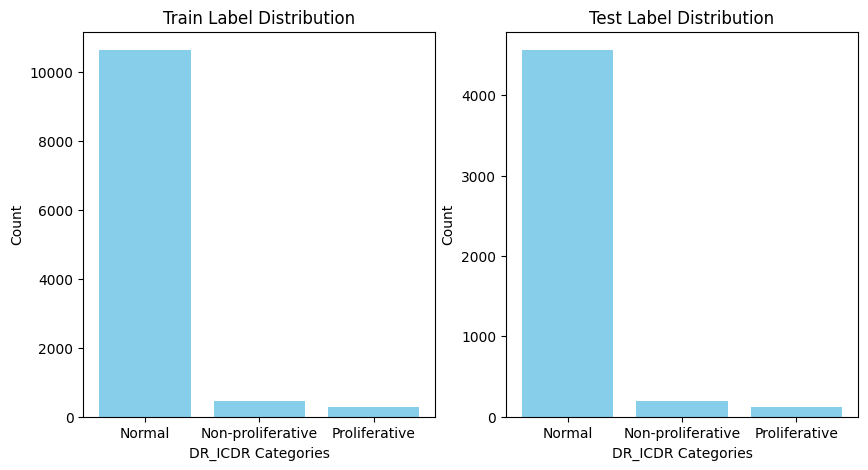

Getting validation set...
Train data shape: (3904, 35)
Test data shape: (976, 35)


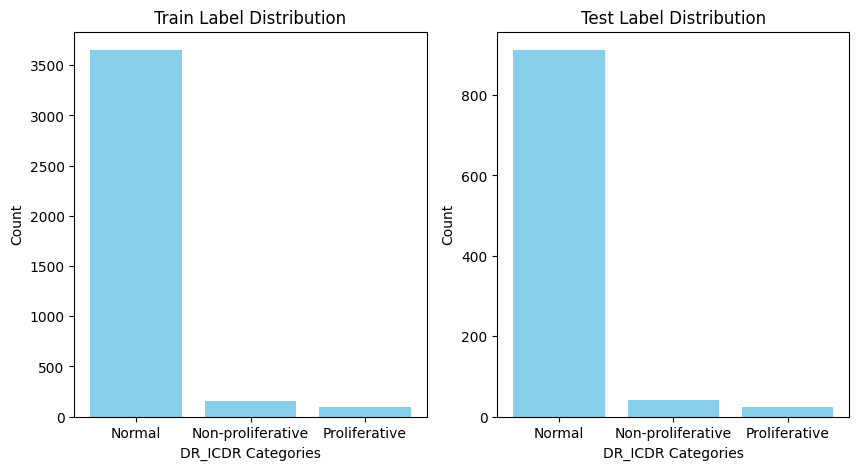

In [21]:
# Split dataset into train, test and validation:
df_train, df_test = split_data(df, LABEL, TEST_SIZE, undersample=False)
print('Getting validation set...')
df_test, df_val = split_data(df_test, LABEL, 0.20)

### Dataloaders

In [22]:
# Train the one hot encoder on the train set and get the labels for the test and validation sets:
train_labels, mlb, train_columns = process_labels(df_train, col=LABEL)

In [23]:
# Define the target image shape

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(SHAPE),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(50),  # Randomly rotate the image by up to 10 degrees
])

if NORM_MEAN is not None and NORM_STD is not None:
    train_transforms.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

test_transform = transforms.Compose([
    transforms.Resize(SHAPE),
    transforms.ToTensor(),
])

if NORM_MEAN is not None and NORM_STD is not None:
    test_transform.transforms.append(transforms.Normalize(mean=NORM_MEAN, std=NORM_STD))

In [24]:
# Create the custom dataset
train_dataset = BRSETDataset(
    df_train, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=train_transforms
)

test_dataset = BRSETDataset(
    df_test, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

val_dataset = BRSETDataset(
    df_val, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

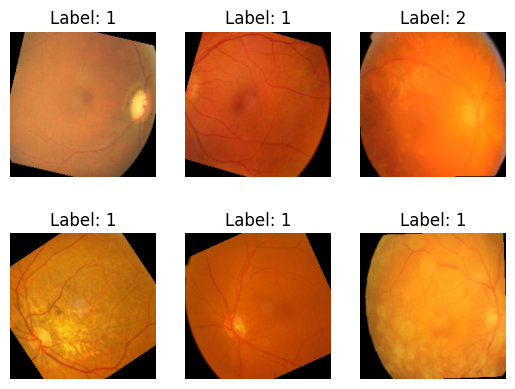

In [25]:
# Print 6 samples with their labels
# Iterate through the DataLoader and plot the images with labels

for batch in train_dataloader:

    images, labels = batch['image'], batch['labels']

    for i in range(len(images)):
        if i == 6:
            break
        plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].permute(1, 2, 0))  # Permute to (H, W, C) from (C, H, W)
        plt.title(f"Label: {np.argmax(labels[i])}")
        plt.axis('off')
    plt.show()
    break

### Model

In [26]:
# Create a DataLoader to generate embeddings
#model = get_retfound(weights='/home/opc/FoundationalRetina/Weights/RETFound_cfp_weights.pth', num_classes=3)
# Create a DataLoader to generate embeddings
backbone_model = FoundationalCVModel(backbone=BACKBONE, mode=MODE)
model = FoundationalCVModelWithClassifier(backbone_model, hidden=HIDDEN, num_classes=num_classes, mode=MODE, backbone_mode=backbone_mode)
model.to(device)

# Use DataParallel to parallelize the model across multiple GPUs
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs!")
    model = nn.DataParallel(model, [0,1])

Using 2 GPUs!


### Training:

In [27]:
if LOSS == 'focal_loss':
    class_distribution = train_dataloader.dataset.labels.sum(axis=0)
    print(f'Class distribution: {class_distribution}')
    class_dis = np.array(class_distribution)
    class_weights =1-class_dis/np.sum(class_dis)
    weights = torch.tensor(class_weights).to(device)
    #criterion = FocalLoss()  # Focal Loss
    criterion = FocalLoss(gamma=2, alpha=weights)
else:
    # Assuming train_loader.dataset.labels is a one-hot representation
    class_indices = np.argmax(train_dataloader.dataset.labels, axis=1)

    # Compute class weights using class indices
    class_weights = compute_class_weight('balanced', classes=np.unique(class_indices), y=class_indices)
    class_weights = torch.tensor(class_weights, dtype=torch.float32)
    criterion = nn.CrossEntropyLoss(weight=class_weights).to(device)
    #criterion = nn.BCEWithLogitsLoss() # Binary Cross-Entropy Loss

if OPTIMIZER == 'adam':
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
elif OPTIMIZER == 'adamw':
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
else:
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 1, Training Loss: 1.0299683920620533


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 1, Validation Loss: 0.8632892428851519, F1 Score: 0.4313994347008406


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 2, Training Loss: 0.9300970598594861


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 2, Validation Loss: 0.8547345370542808, F1 Score: 0.4487837173230432


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 3, Training Loss: 0.8344489682800649


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 3, Validation Loss: 1.425900652760365, F1 Score: 0.18980521680958187


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 4, Training Loss: 0.8029654579278961


100%|██████████| 61/61 [00:18<00:00,  3.35it/s]


Epoch 4, Validation Loss: 0.7303022529746666, F1 Score: 0.6046950240369982


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 5, Training Loss: 0.7903469719641497


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 5, Validation Loss: 0.8868949628267132, F1 Score: 0.5280135346799443


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 6, Training Loss: 0.7544903067997499


100%|██████████| 61/61 [00:18<00:00,  3.29it/s]


Epoch 6, Validation Loss: 0.8043417217301541, F1 Score: 0.5122383876253084


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 7, Training Loss: 0.7280111729031365


100%|██████████| 61/61 [00:18<00:00,  3.39it/s]


Epoch 7, Validation Loss: 0.7666260440085755, F1 Score: 0.6327710031839295


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 8, Training Loss: 0.7008872419658504


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 8, Validation Loss: 0.652239168398693, F1 Score: 0.7132842484294057


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 9, Training Loss: 0.640981042182094


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 9, Validation Loss: 0.5970870101305304, F1 Score: 0.7291750653228816


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 10, Training Loss: 0.6429460517580757


100%|██████████| 61/61 [00:18<00:00,  3.33it/s]


Epoch 10, Validation Loss: 0.49867581649393333, F1 Score: 0.7153637064861678


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 11, Training Loss: 0.5978425916001787


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 11, Validation Loss: 0.683067470300393, F1 Score: 0.7112360616304524


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 12, Training Loss: 0.5646197088167406


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 12, Validation Loss: 0.6904608889437113, F1 Score: 0.738556800885568


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 13, Training Loss: 0.5195376987181856


100%|██████████| 61/61 [00:18<00:00,  3.30it/s]


Epoch 13, Validation Loss: 0.6344641272406109, F1 Score: 0.7778680657076739


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 14, Training Loss: 0.5143200133226058


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 14, Validation Loss: 0.6123694641912569, F1 Score: 0.7462661609216973


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 15, Training Loss: 0.5629590584143075


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 15, Validation Loss: 0.598267525434494, F1 Score: 0.7460624686945391


100%|██████████| 712/712 [07:00<00:00,  1.70it/s]


Epoch 16, Training Loss: 0.4961860803311712


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 16, Validation Loss: 0.5612753027530967, F1 Score: 0.7353024147057204


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 17, Training Loss: 0.4612156020718093


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 17, Validation Loss: 0.5621977190135933, F1 Score: 0.7266026119982351


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 18, Training Loss: 0.42108770967932063


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 18, Validation Loss: 0.6252252126692749, F1 Score: 0.7654376971957108


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 19, Training Loss: 0.42879022681677526


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 19, Validation Loss: 0.6496077315484892, F1 Score: 0.7671170113266008


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 20, Training Loss: 0.40107857963342347


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 20, Validation Loss: 0.46193151395828996, F1 Score: 0.8164418216378461


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 21, Training Loss: 0.3429312329854439


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 21, Validation Loss: 0.7545242199643714, F1 Score: 0.74207400033184


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 22, Training Loss: 0.337581734353509


100%|██████████| 61/61 [00:18<00:00,  3.28it/s]


Epoch 22, Validation Loss: 0.6351397685462334, F1 Score: 0.7298724528102735


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 23, Training Loss: 0.2992056237894707


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 23, Validation Loss: 0.8182312790609774, F1 Score: 0.726762467845551


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 24, Training Loss: 0.26124049290711204


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 24, Validation Loss: 0.5766824232261689, F1 Score: 0.7719344281413775


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 25, Training Loss: 0.2985948111464301


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 25, Validation Loss: 0.6469917535537579, F1 Score: 0.7781790825751642


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 26, Training Loss: 0.28304968803880337


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 26, Validation Loss: 0.6204117051035655, F1 Score: 0.7003690113716615


100%|██████████| 712/712 [06:58<00:00,  1.70it/s]


Epoch 27, Training Loss: 0.2742444911966456


100%|██████████| 61/61 [00:18<00:00,  3.30it/s]


Epoch 27, Validation Loss: 0.7313103859969339, F1 Score: 0.7906444670771261


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 28, Training Loss: 0.24260873253603749


100%|██████████| 61/61 [00:18<00:00,  3.33it/s]


Epoch 28, Validation Loss: 0.5008274843824692, F1 Score: 0.7565483743149328


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 29, Training Loss: 0.23143124038855847


100%|██████████| 61/61 [00:18<00:00,  3.33it/s]


Epoch 29, Validation Loss: 0.5216047682906272, F1 Score: 0.7732170186715641


100%|██████████| 712/712 [07:00<00:00,  1.70it/s]


Epoch 30, Training Loss: 0.21697510922134047


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 30, Validation Loss: 0.5281505038748022, F1 Score: 0.8047939304049924


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 31, Training Loss: 0.20617185058621584


100%|██████████| 61/61 [00:18<00:00,  3.35it/s]


Epoch 31, Validation Loss: 0.5751461298739324, F1 Score: 0.7838356526411188


100%|██████████| 712/712 [07:00<00:00,  1.70it/s]


Epoch 32, Training Loss: 0.18207190687286803


100%|██████████| 61/61 [00:18<00:00,  3.35it/s]


Epoch 32, Validation Loss: 0.5438506328729821, F1 Score: 0.7712136118647931


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 33, Training Loss: 0.24865765134762094


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 33, Validation Loss: 0.8740224493667483, F1 Score: 0.7407548780055032


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 34, Training Loss: 0.19406436337812102


100%|██████████| 61/61 [00:18<00:00,  3.36it/s]


Epoch 34, Validation Loss: 0.8862441471151885, F1 Score: 0.7583115752583862


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 35, Training Loss: 0.1416682742426193


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 35, Validation Loss: 0.7235542493643331, F1 Score: 0.7783807128041206


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 36, Training Loss: 0.1615759177693281


100%|██████████| 61/61 [00:18<00:00,  3.31it/s]


Epoch 36, Validation Loss: 0.6144225238898738, F1 Score: 0.7795199182839632


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 37, Training Loss: 0.13586253054659772


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 37, Validation Loss: 0.5410781119507356, F1 Score: 0.7721988795518208


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 38, Training Loss: 0.16348968852269516


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 38, Validation Loss: 0.9113716291049954, F1 Score: 0.734205493258418


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 39, Training Loss: 0.1465514674390342


100%|██████████| 61/61 [00:18<00:00,  3.29it/s]


Epoch 39, Validation Loss: 0.8699282507305263, F1 Score: 0.7119212761494138


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 40, Training Loss: 0.1540772528315664


100%|██████████| 61/61 [00:18<00:00,  3.34it/s]


Epoch 40, Validation Loss: 0.5717882361095094, F1 Score: 0.7654814923571346


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 41, Training Loss: 0.12959242919643063


100%|██████████| 61/61 [00:18<00:00,  3.29it/s]


Epoch 41, Validation Loss: 0.6562229007345121, F1 Score: 0.7628436684728075


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 42, Training Loss: 0.13419238075854653


100%|██████████| 61/61 [00:18<00:00,  3.33it/s]


Epoch 42, Validation Loss: 0.9707689903310088, F1 Score: 0.7532450654353763


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 43, Training Loss: 0.1492283265596894


100%|██████████| 61/61 [00:18<00:00,  3.30it/s]


Epoch 43, Validation Loss: 0.9432104457108701, F1 Score: 0.7669670948359473


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 44, Training Loss: 0.125768752181327


100%|██████████| 61/61 [00:18<00:00,  3.30it/s]


Epoch 44, Validation Loss: 1.0945243841441745, F1 Score: 0.7704575224343176


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 45, Training Loss: 0.09504319067908389


100%|██████████| 61/61 [00:17<00:00,  3.40it/s]


Epoch 45, Validation Loss: 0.8736539766818407, F1 Score: 0.7545198189981196


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 46, Training Loss: 0.0933926346734051


100%|██████████| 61/61 [00:18<00:00,  3.38it/s]


Epoch 46, Validation Loss: 0.8521468298066958, F1 Score: 0.7665078943199776


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 47, Training Loss: 0.08869221178439363


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 47, Validation Loss: 0.8126109018692839, F1 Score: 0.7484800676290037


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 48, Training Loss: 0.09231152184787625


100%|██████████| 61/61 [00:18<00:00,  3.37it/s]


Epoch 48, Validation Loss: 1.3235595235333886, F1 Score: 0.6711973739455704


100%|██████████| 712/712 [06:59<00:00,  1.70it/s]


Epoch 49, Training Loss: 0.09138547148610454


100%|██████████| 61/61 [00:17<00:00,  3.41it/s]


Epoch 49, Validation Loss: 0.8086381211769996, F1 Score: 0.7602106958845264


100%|██████████| 712/712 [07:00<00:00,  1.69it/s]


Epoch 50, Training Loss: 0.07727676076229839


100%|██████████| 61/61 [00:18<00:00,  3.32it/s]


Epoch 50, Validation Loss: 1.6322974753337072, F1 Score: 0.7272516385595406


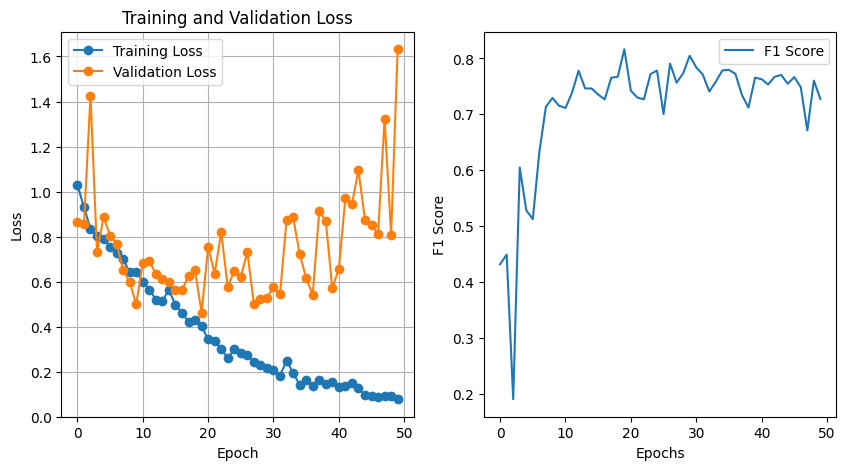

Training finished.


In [28]:
model = train(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=num_epochs, save=False, device=device)

### Test

100%|██████████| 244/244 [01:09<00:00,  3.54it/s]


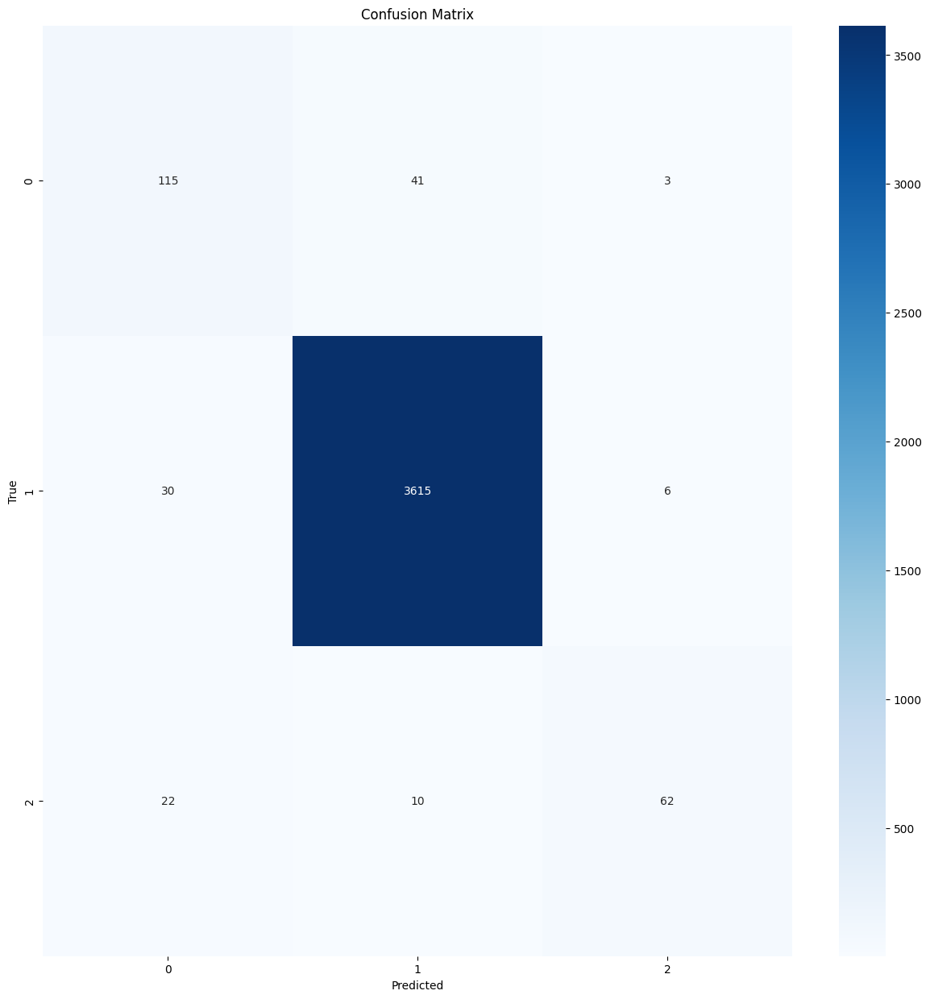

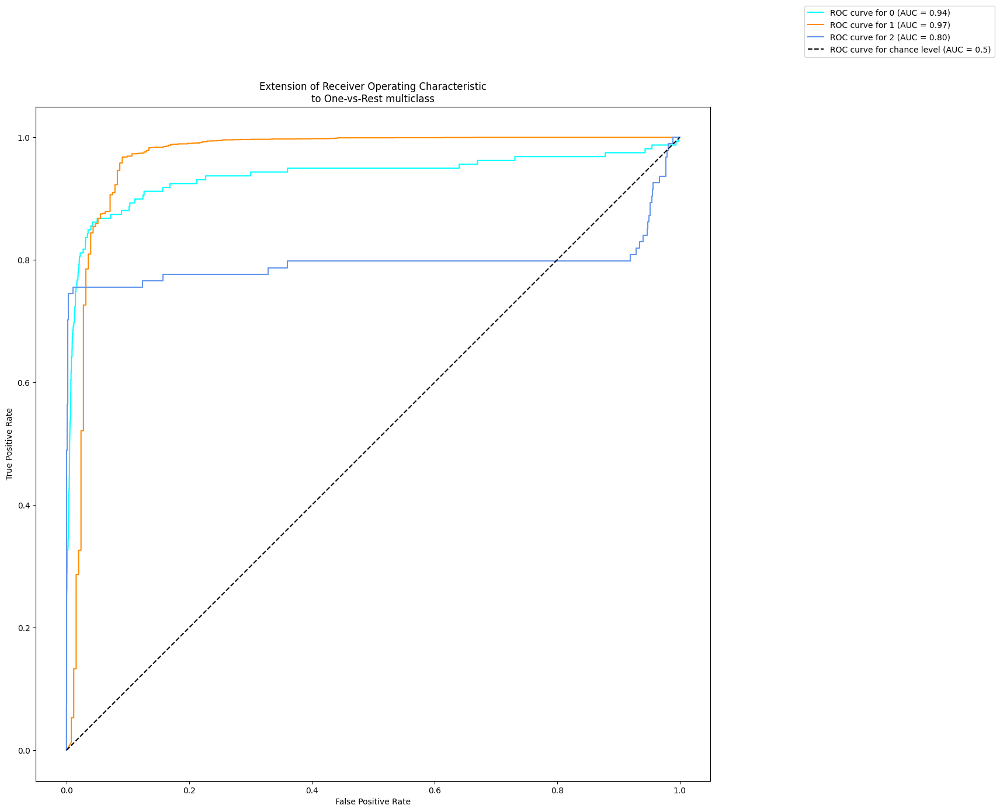

              precision    recall  f1-score   support

           0       0.69      0.72      0.71       159
           1       0.99      0.99      0.99      3651
           2       0.87      0.66      0.75        94

    accuracy                           0.97      3904
   macro avg       0.85      0.79      0.82      3904
weighted avg       0.97      0.97      0.97      3904

##################################################  Saliency Maps  ##################################################

Class 0:


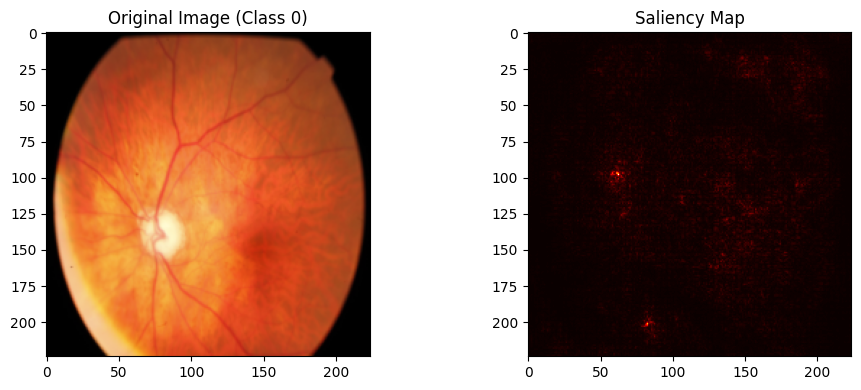

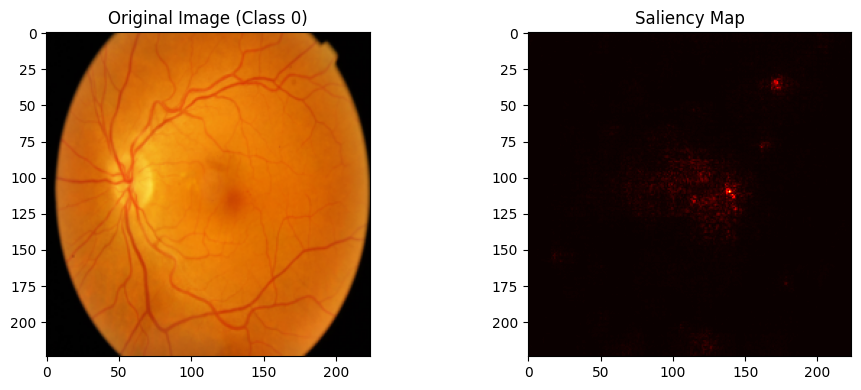

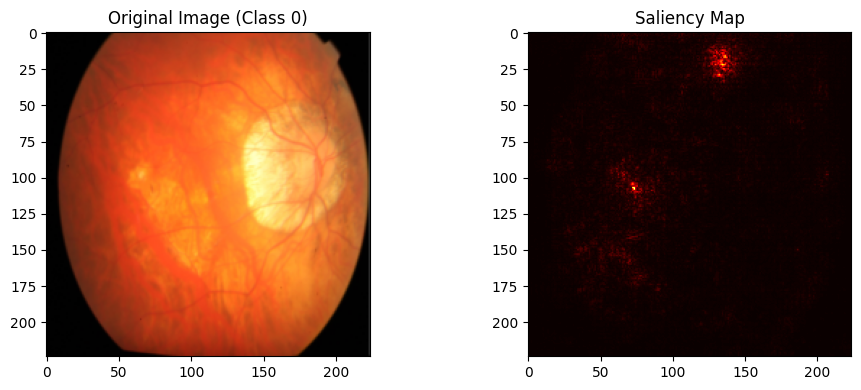

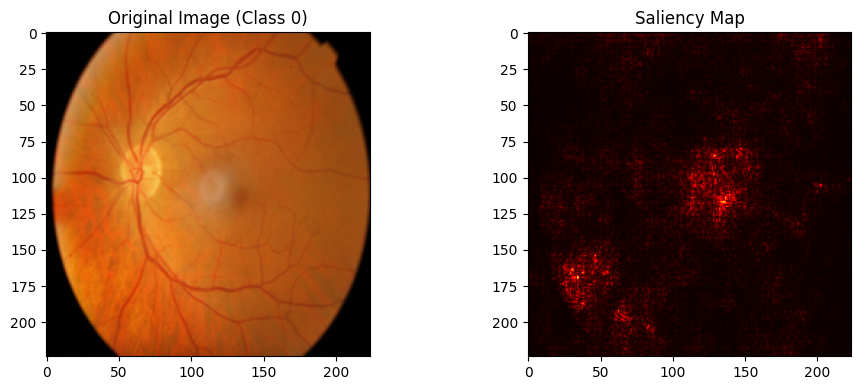

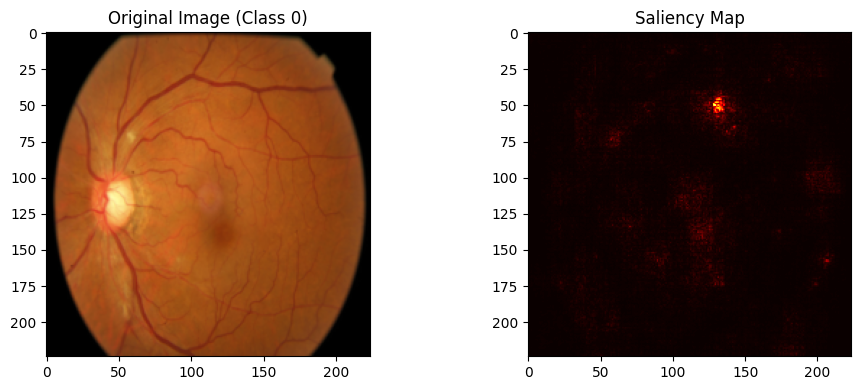

Class 1:


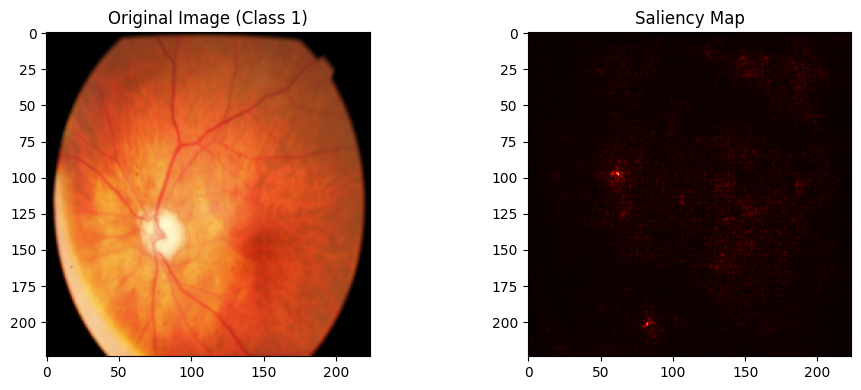

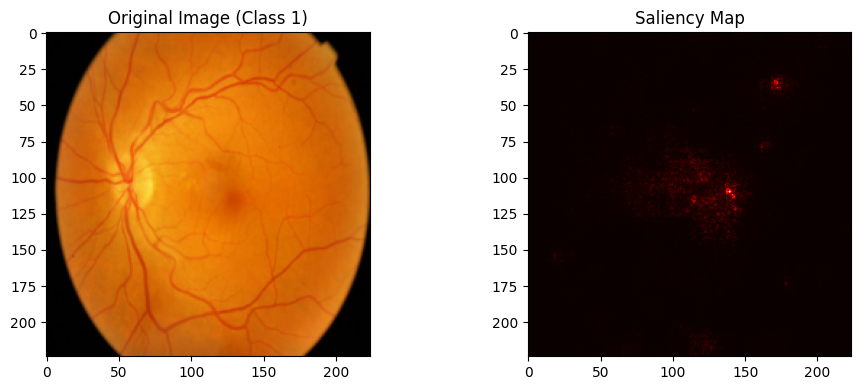

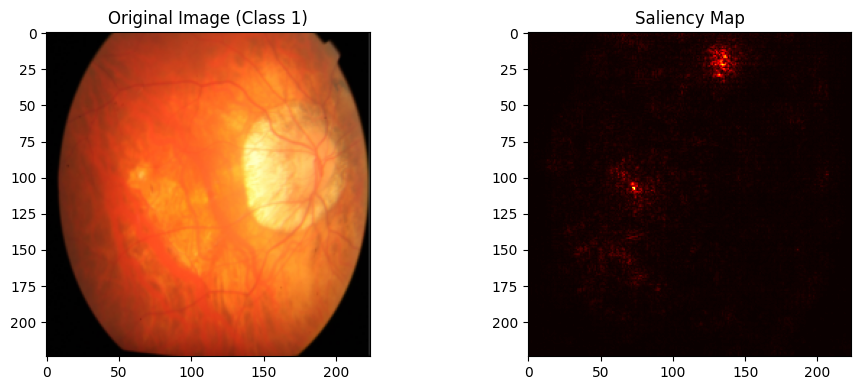

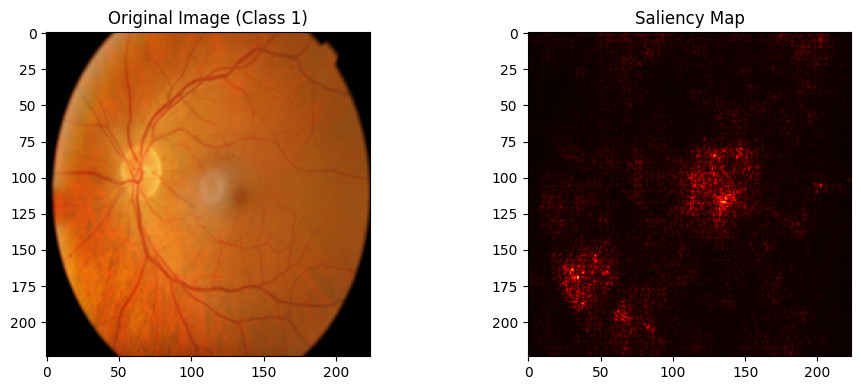

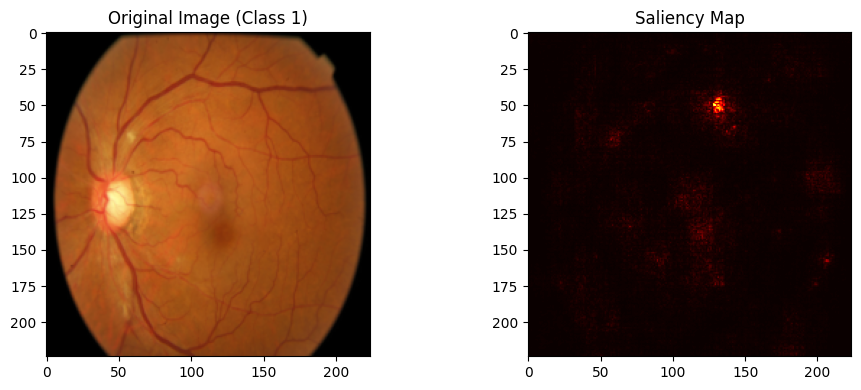

Class 2:


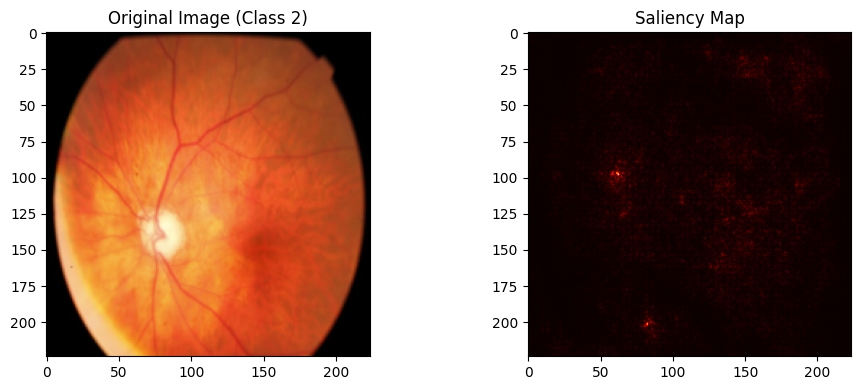

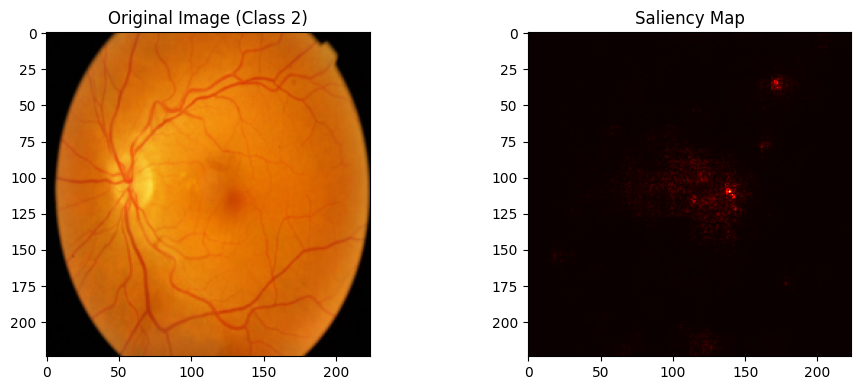

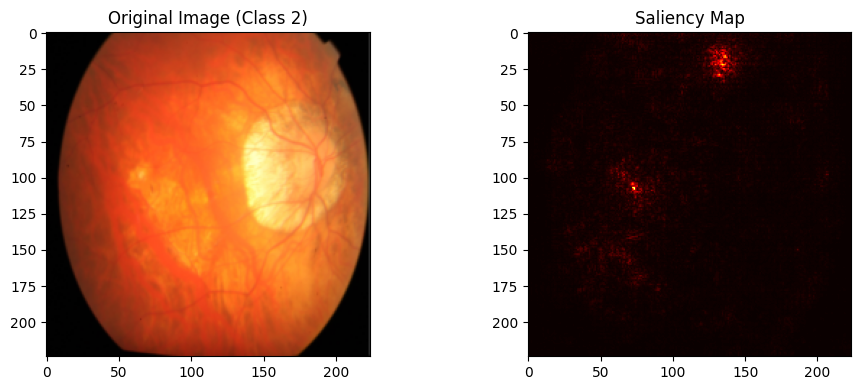

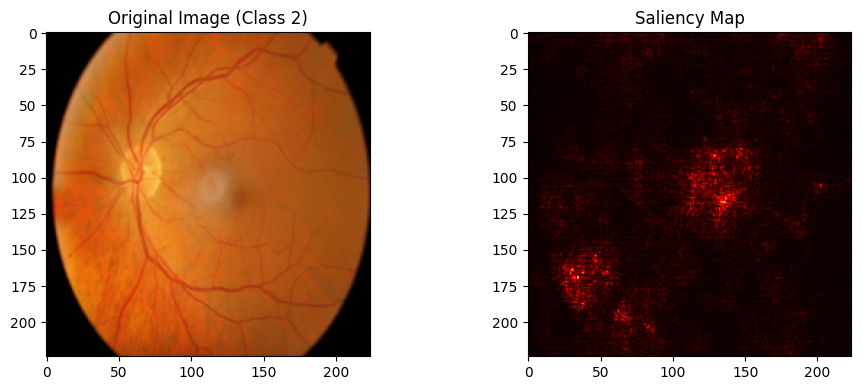

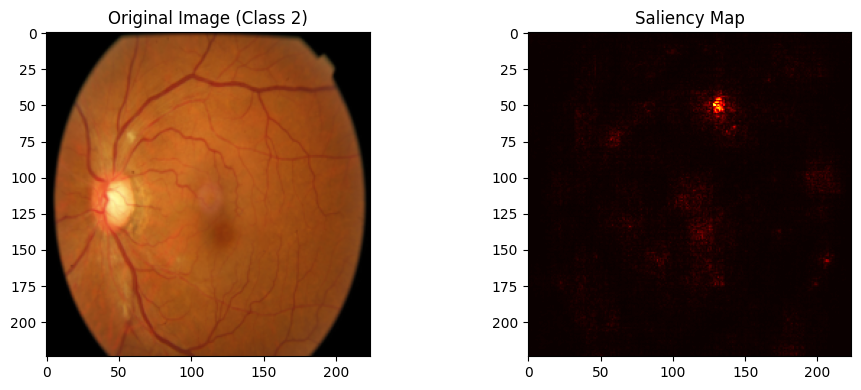

In [29]:
test(model, test_dataloader, saliency=True, device=device)

### Image quality assessment

In [30]:
# Good quality images
adequate_df = df_test[df_test['quality'] == 'Adequate']

# Bad quality images
inadequate_df = df_test[df_test['quality'] == 'Inadequate']

adequate_dataset = BRSETDataset(
    adequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

inadequate_dataset = BRSETDataset(
    inadequate_df, 
    IMAGE_COL, 
    IMAGES, 
    LABEL, 
    mlb, 
    train_columns, 
    transform=test_transform
)

adequate_dataloader = DataLoader(adequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
inadequate_dataloader = DataLoader(inadequate_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

#### Adequate image quality

  0%|          | 0/215 [00:00<?, ?it/s]

100%|██████████| 215/215 [01:00<00:00,  3.56it/s]


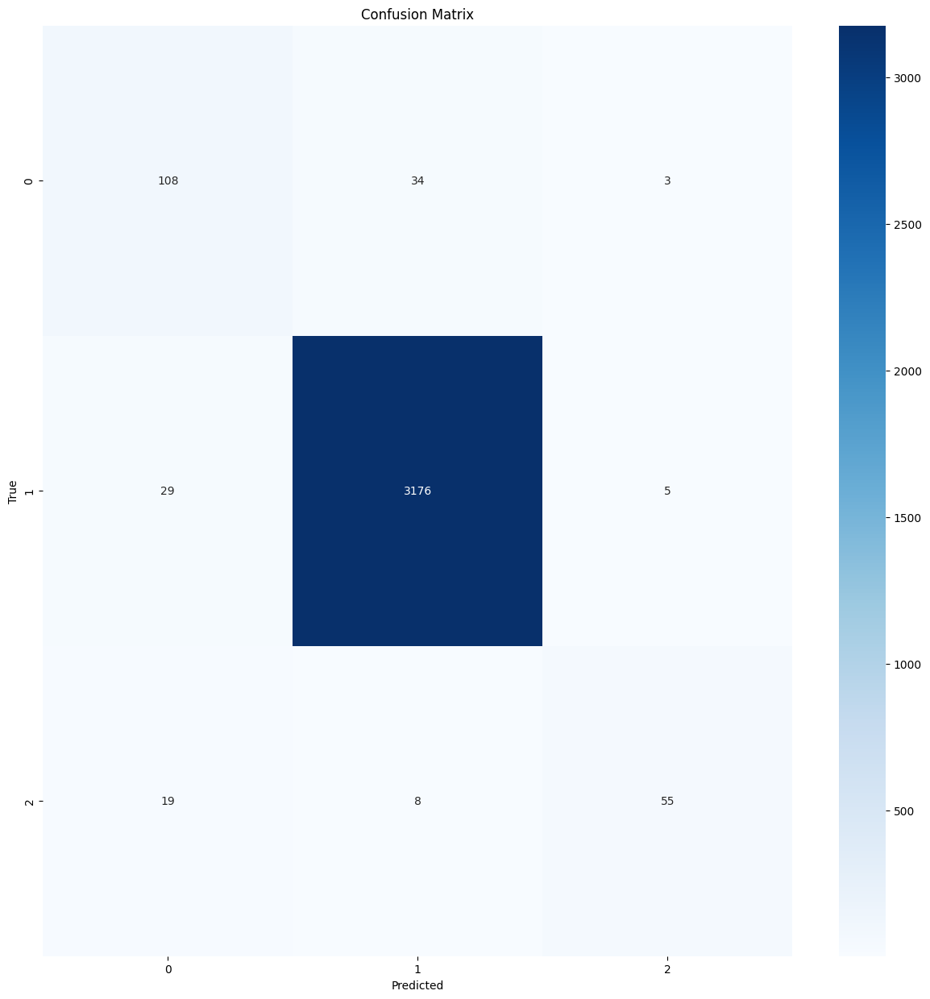

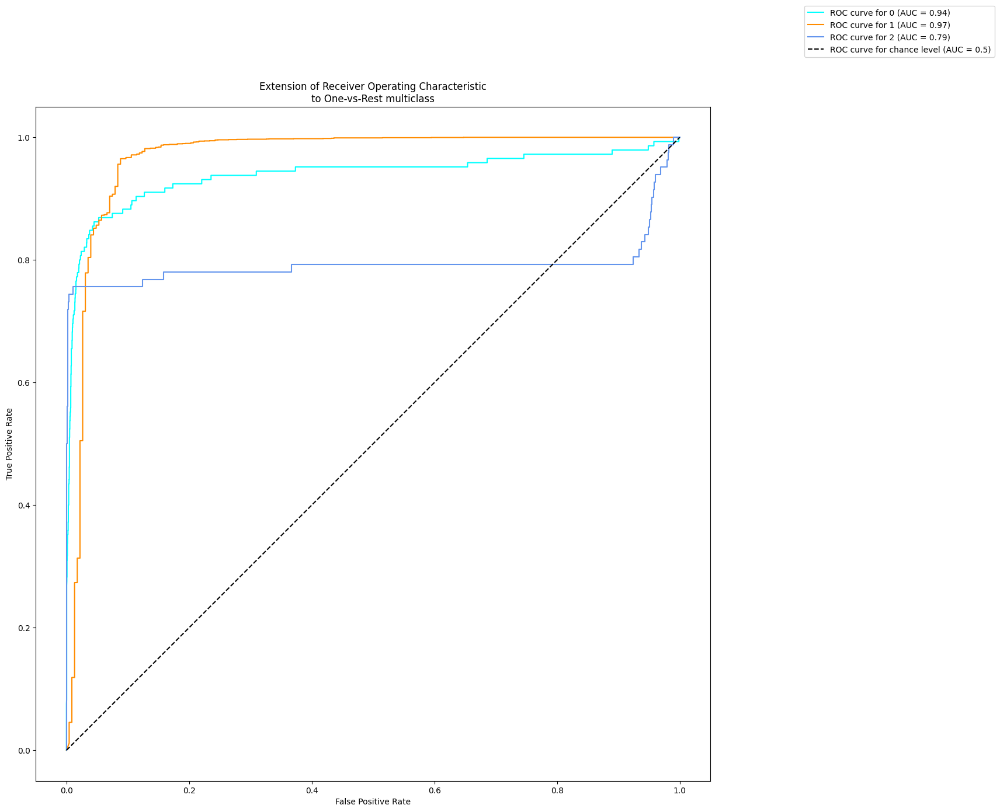

              precision    recall  f1-score   support

           0       0.69      0.74      0.72       145
           1       0.99      0.99      0.99      3210
           2       0.87      0.67      0.76        82

    accuracy                           0.97      3437
   macro avg       0.85      0.80      0.82      3437
weighted avg       0.97      0.97      0.97      3437

##################################################  Saliency Maps  ##################################################

Class 0:


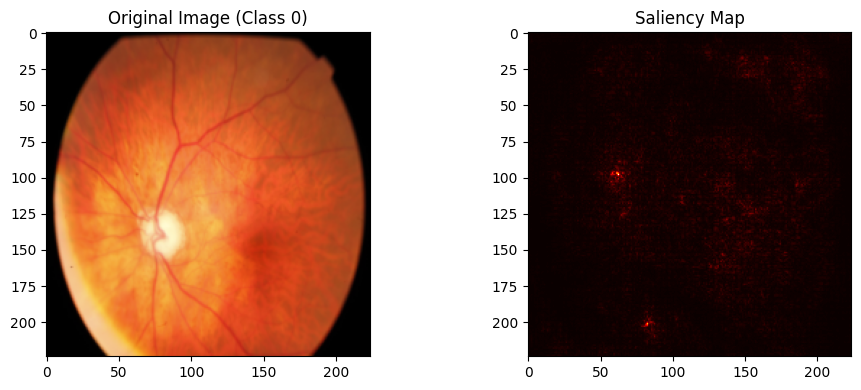

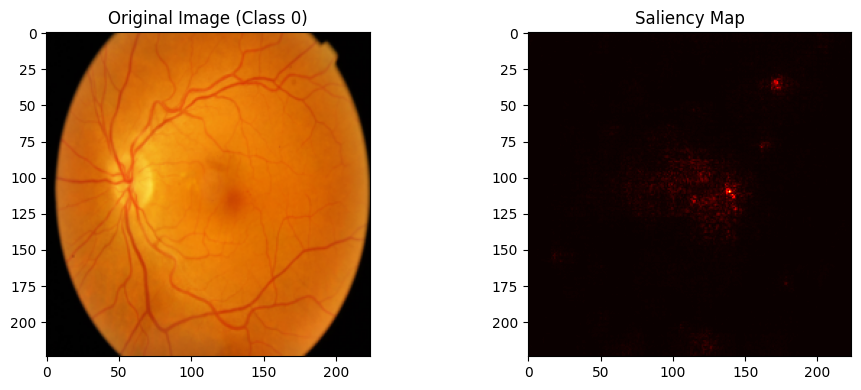

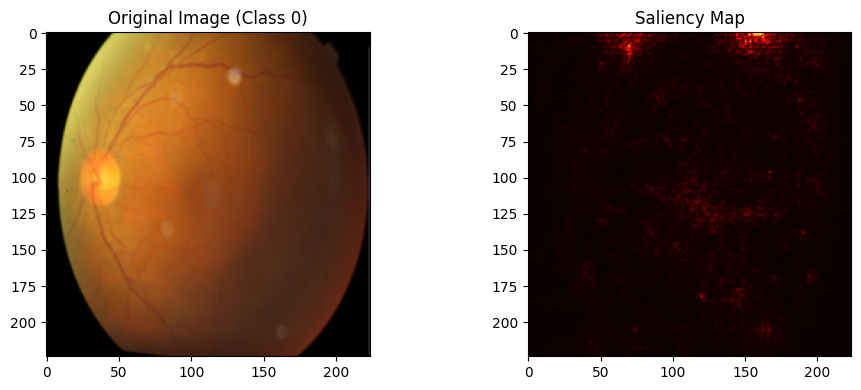

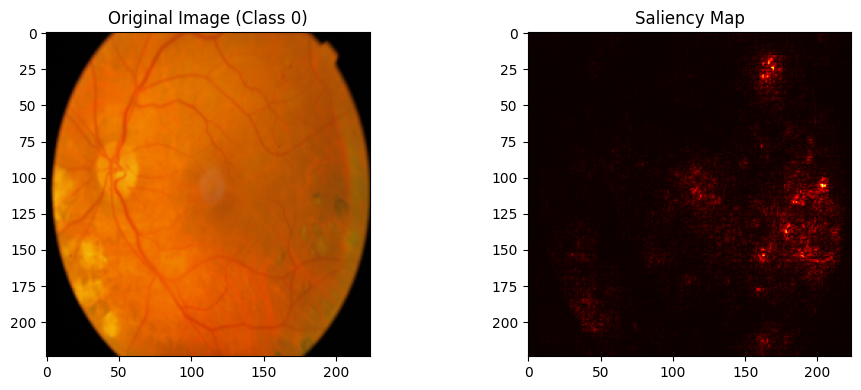

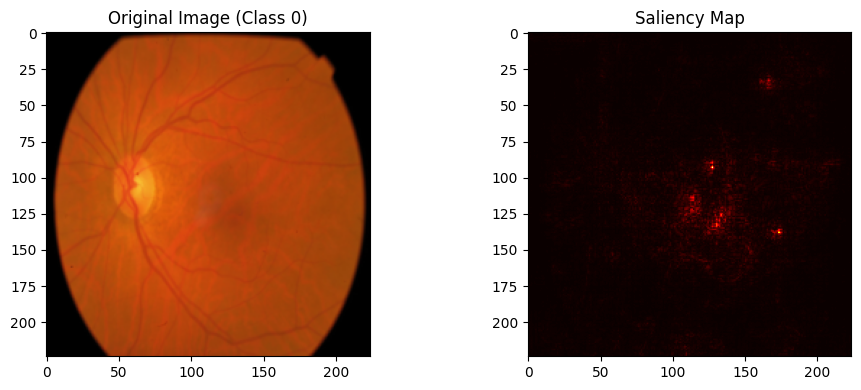

Class 1:


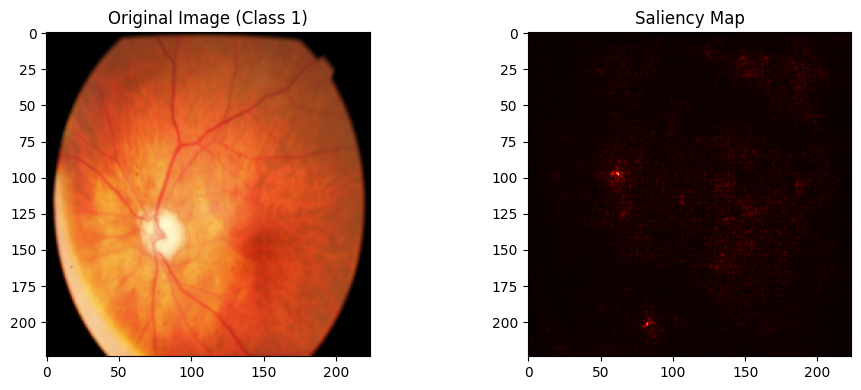

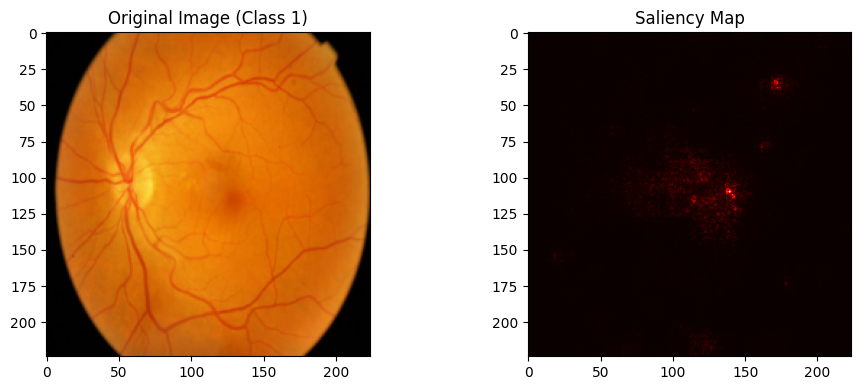

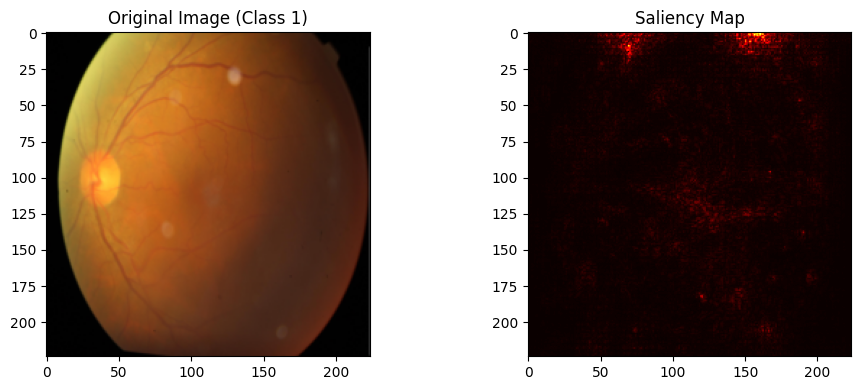

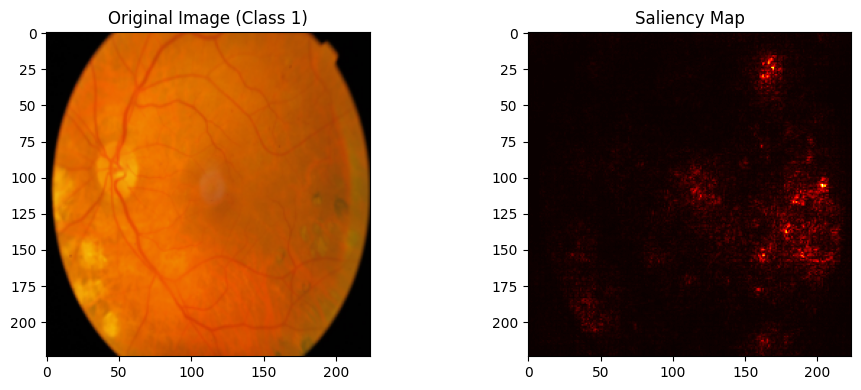

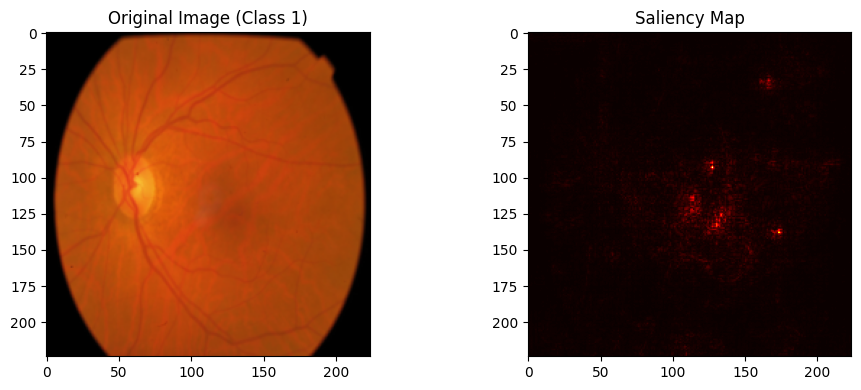

Class 2:


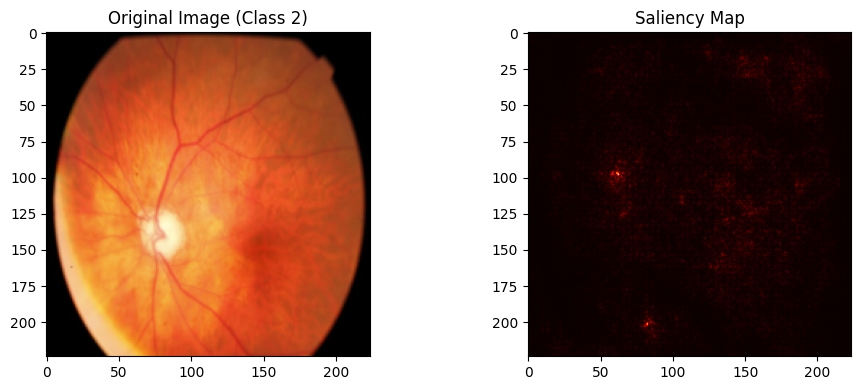

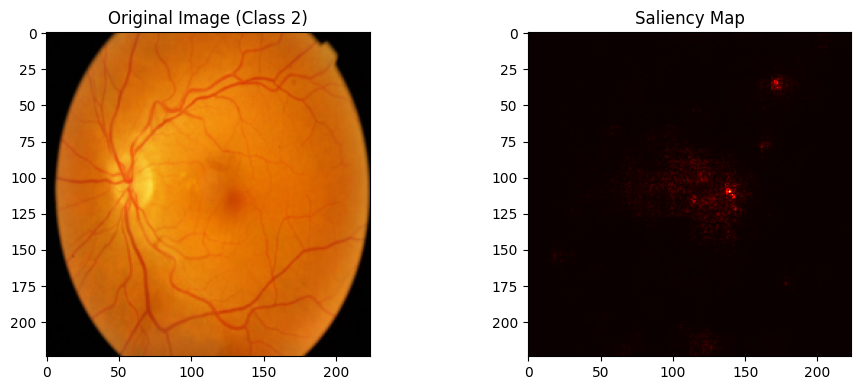

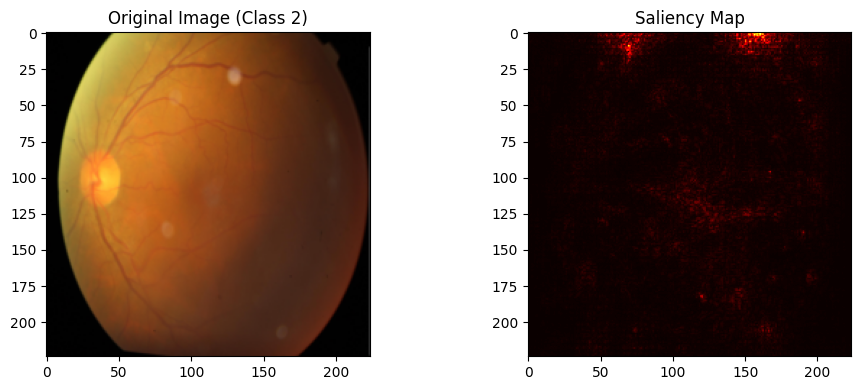

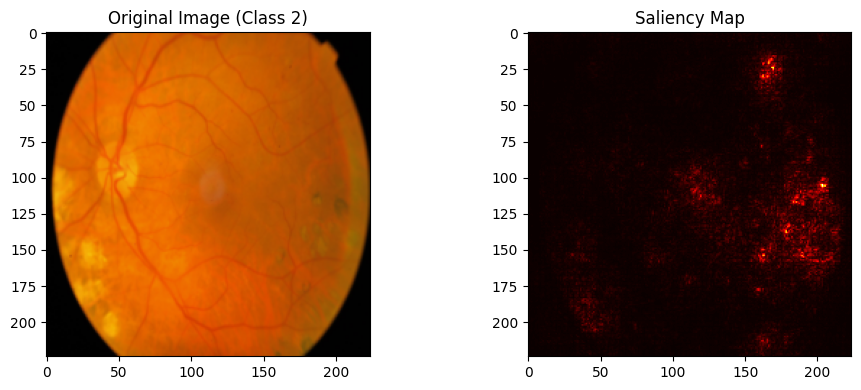

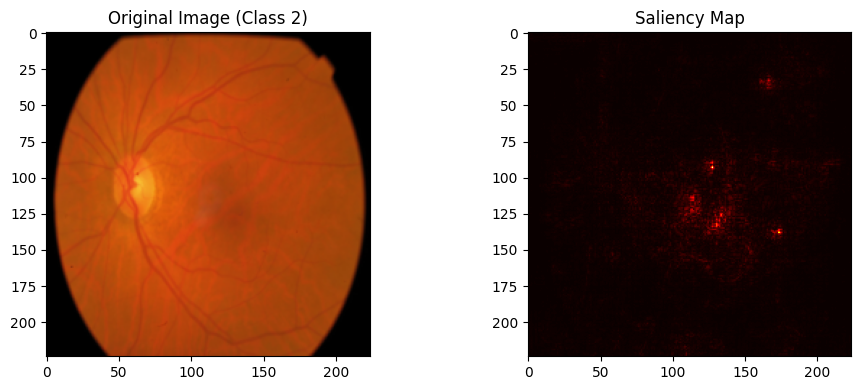

In [31]:
test(model, adequate_dataloader, saliency=True, device=device)

#### Inadequate image quality

100%|██████████| 30/30 [00:09<00:00,  3.05it/s]


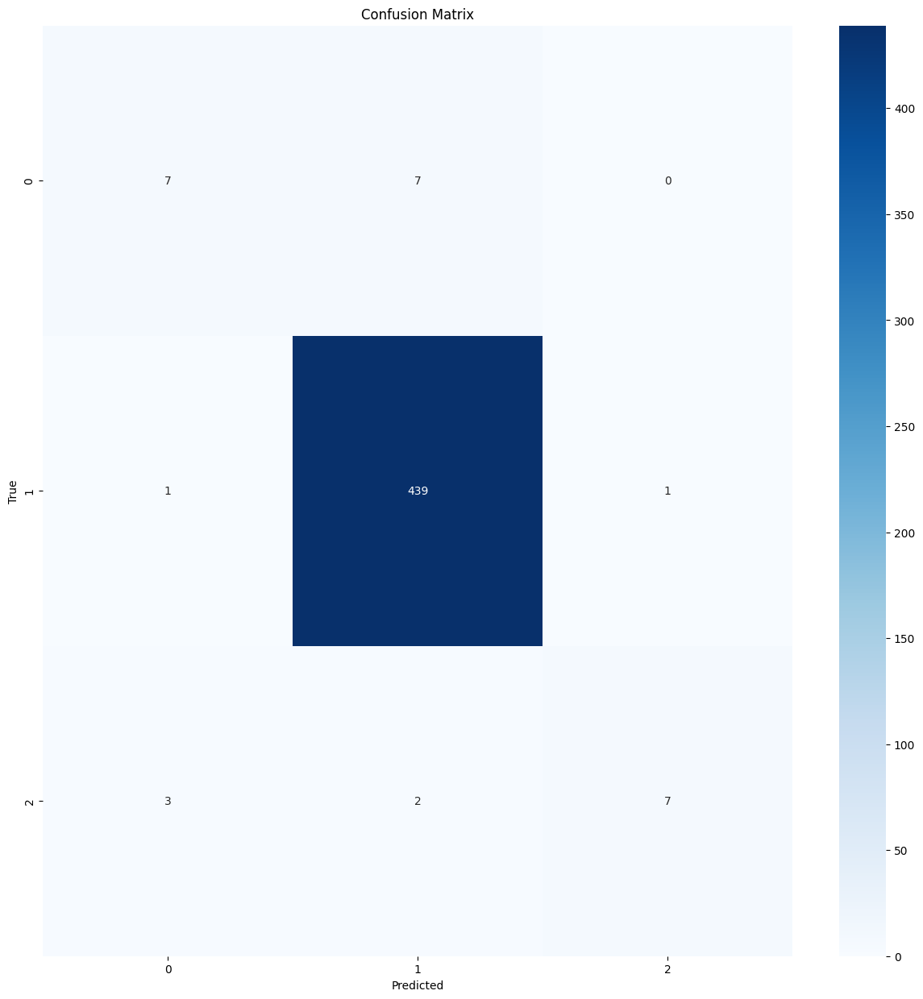

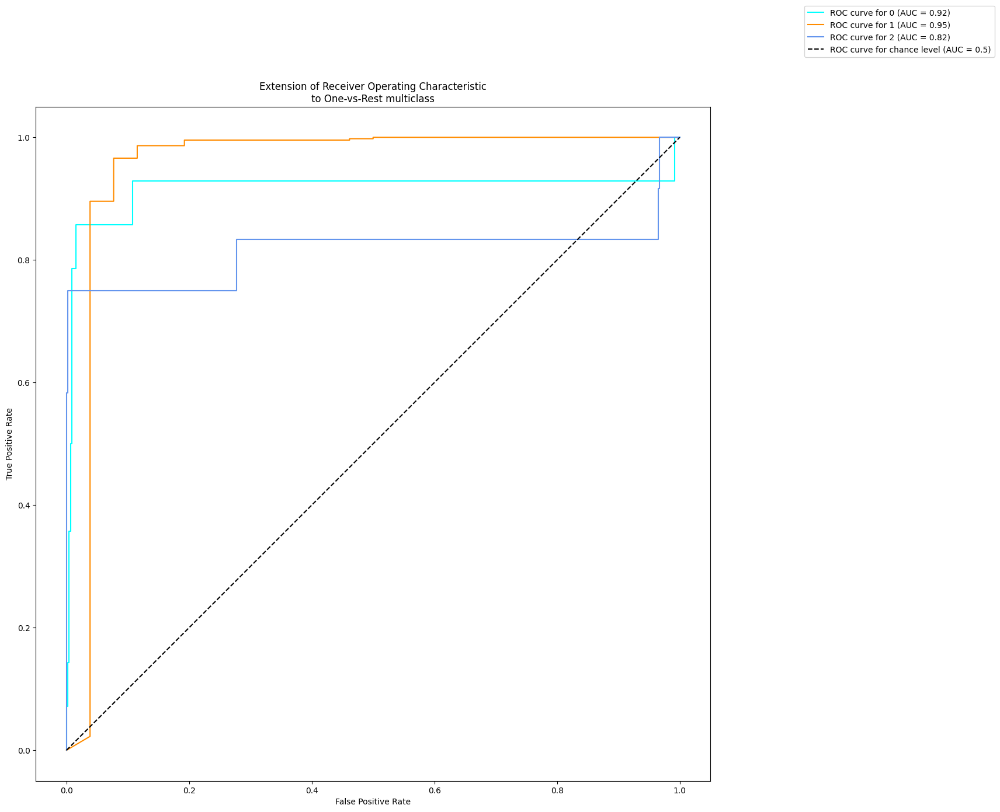

              precision    recall  f1-score   support

           0       0.64      0.50      0.56        14
           1       0.98      1.00      0.99       441
           2       0.88      0.58      0.70        12

    accuracy                           0.97       467
   macro avg       0.83      0.69      0.75       467
weighted avg       0.97      0.97      0.97       467

##################################################  Saliency Maps  ##################################################

Class 0:


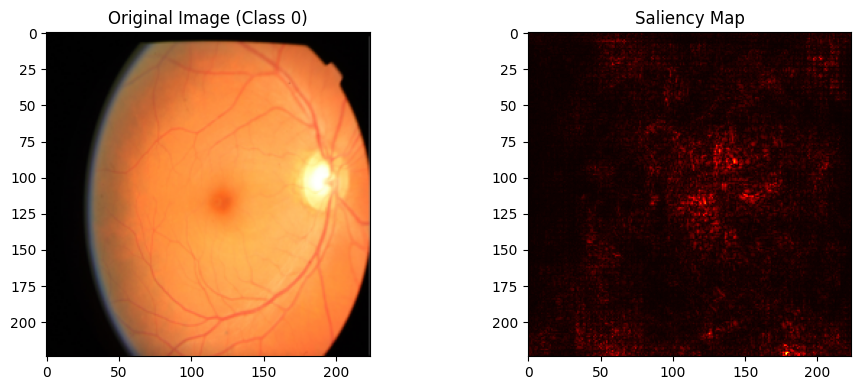

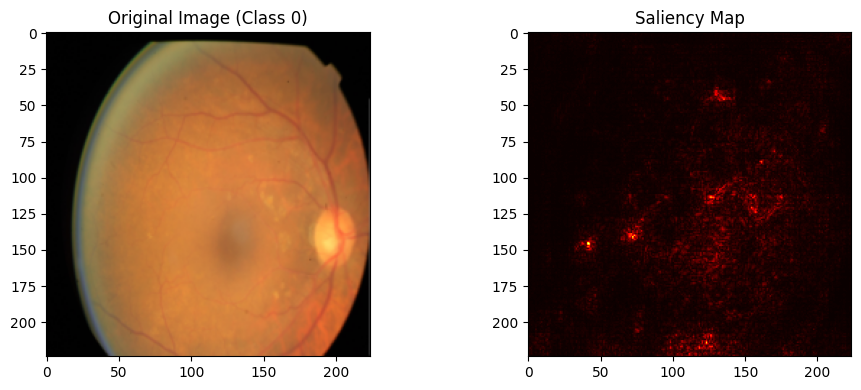

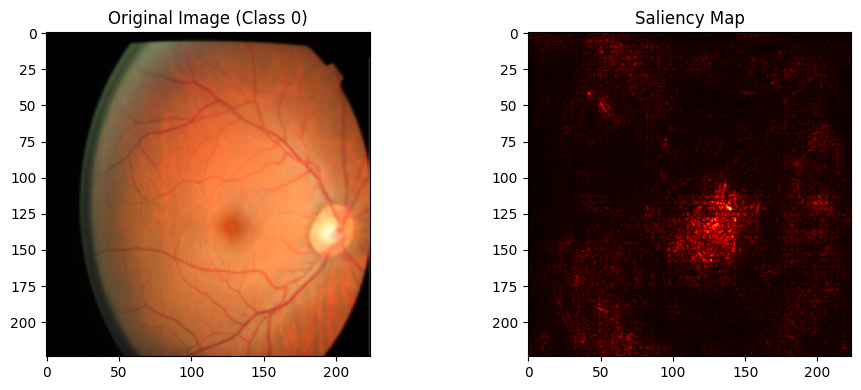

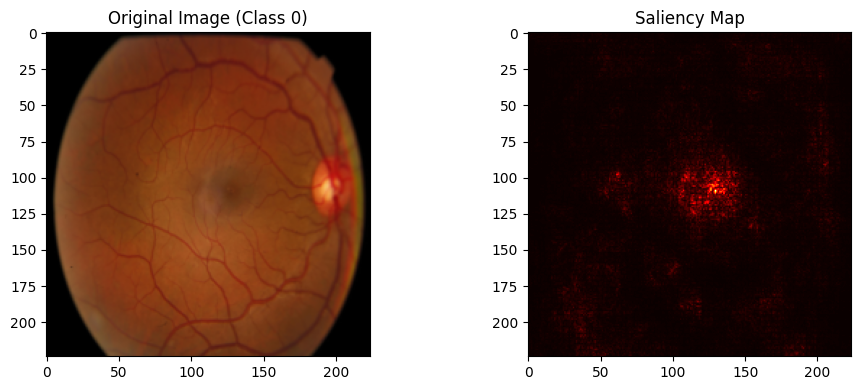

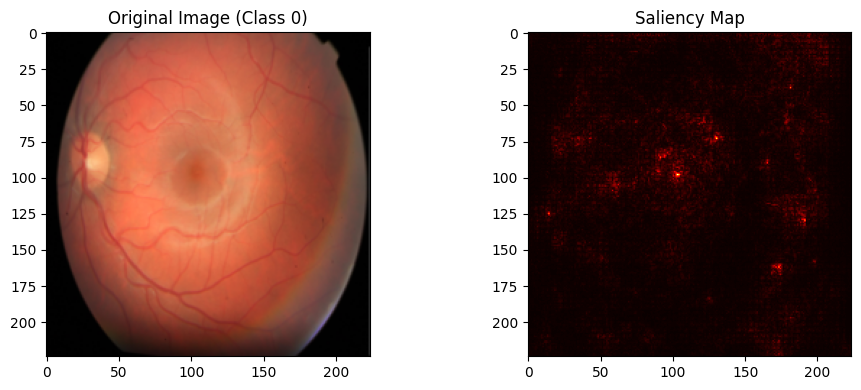

Class 1:


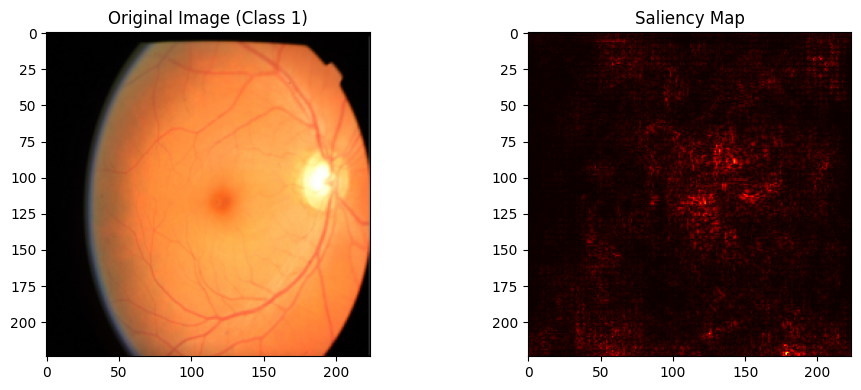

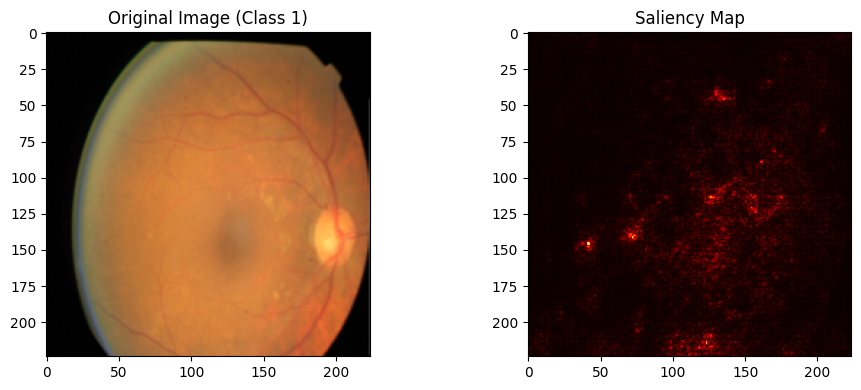

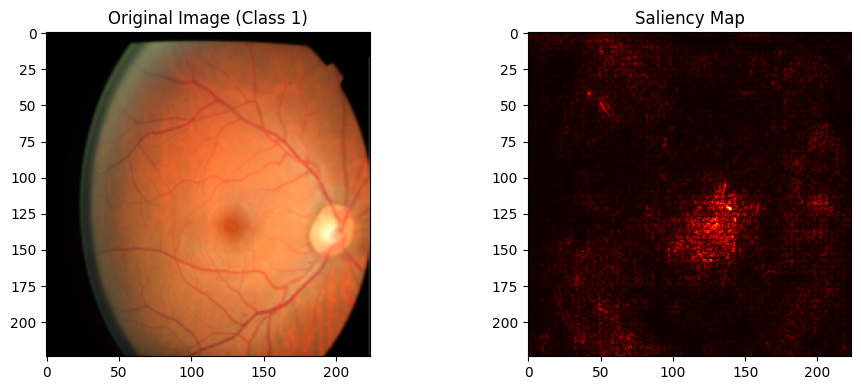

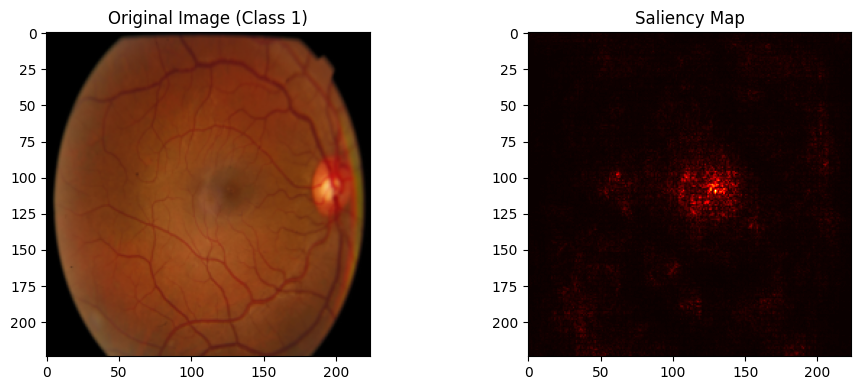

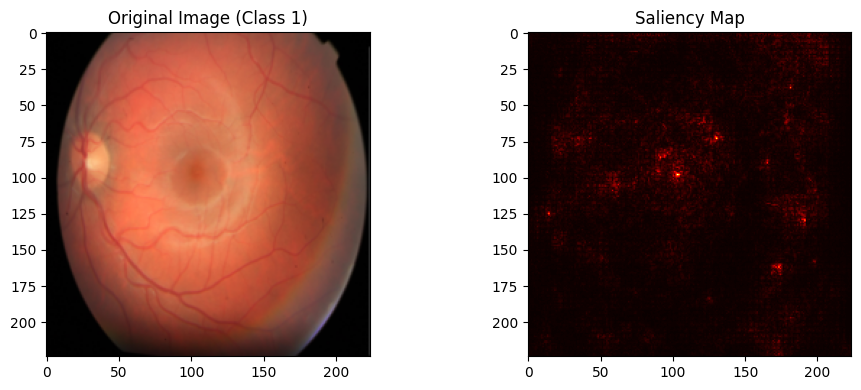

Class 2:


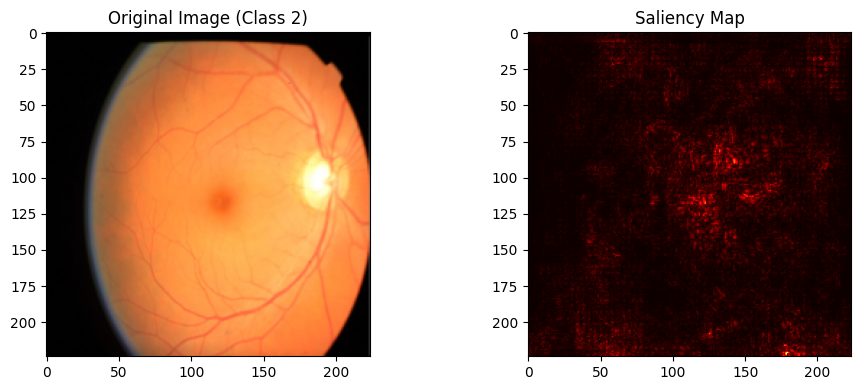

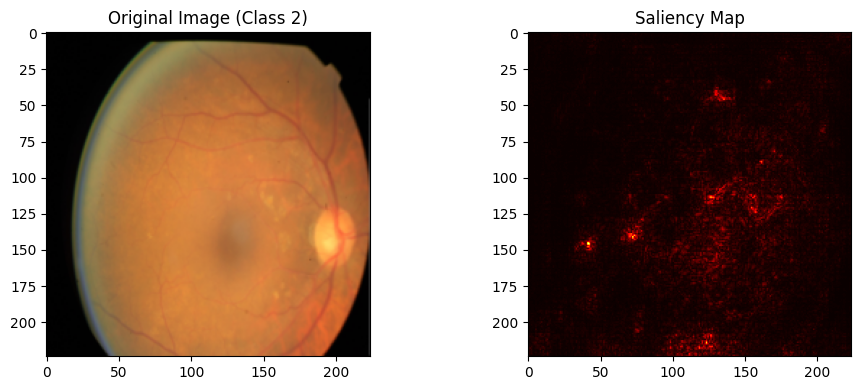

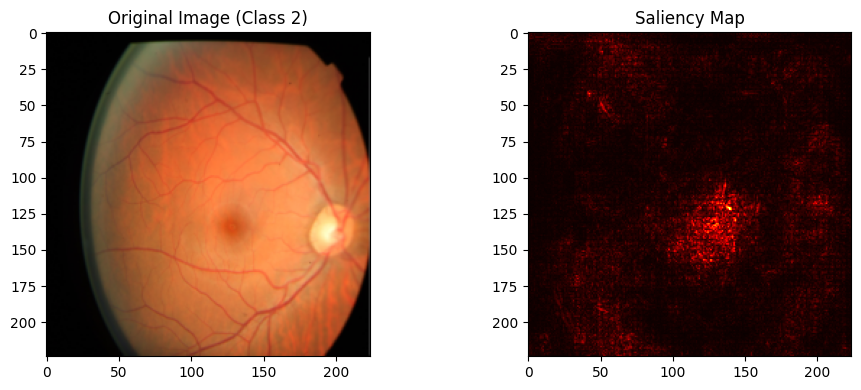

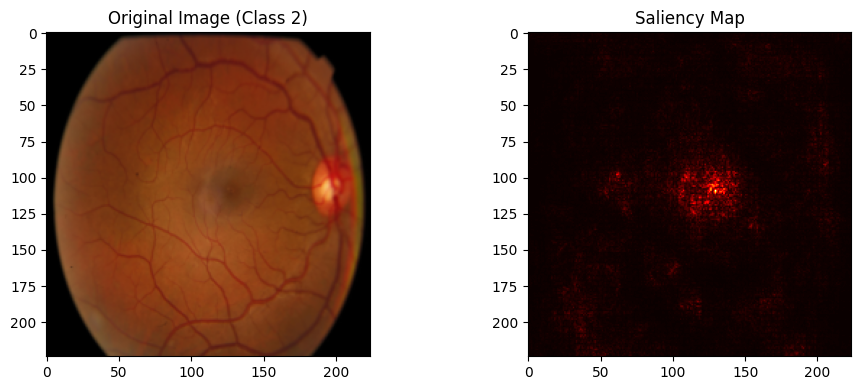

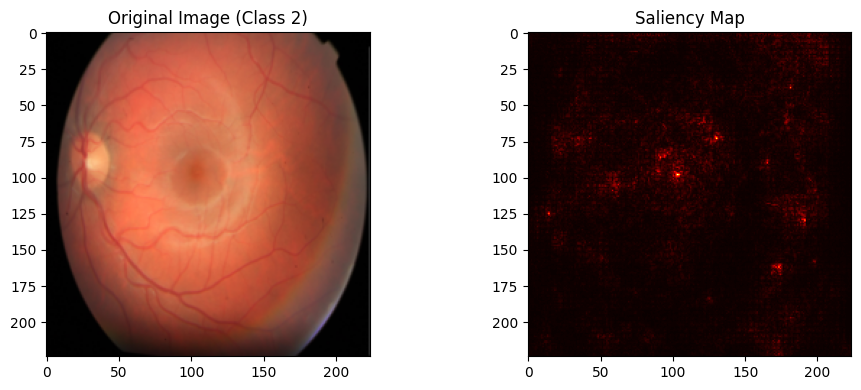

In [32]:
test(model, inadequate_dataloader, saliency=True, device=device)